In [530]:
import sys
import random
import os
import xgi
import numpy as np
import iisignature as iis
import matplotlib.pyplot as plt
import gudhi
from gudhi import plot_persistence_diagram
from gudhi import plot_persistence_density
from gtda.homology import VietorisRipsPersistence
from gtda.homology import FlagserPersistence
from gtda.diagrams import PersistenceEntropy
from gtda.diagrams import Amplitude
from gudhi.representations.vector_methods import Entropy
from gtda.diagrams import PairwiseDistance
from gtda.plotting import plot_diagram
import numpy.random as rd
import gudhi.representations
%run FUNCTIONS.ipynb
%run Kuramoto_new_def.ipynb

Unnamed SimplicialComplex with 3 nodes and 3 simplices


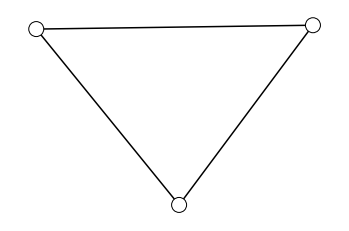

In [531]:
N = 3
ps = [1.0, 0]

S = xgi.random_simplicial_complex(N, ps, seed=1)
print(S)

tag_sc = f"random_simplicial_complex_N_{N}_ps_{ps}"
xgi.draw(S)

k1_avg_sc = S.nodes.degree(order=1).mean()
k2_avg_sc = S.nodes.degree(order=2).mean()
links_sc = S.edges.filterby("order", 1).members()
triangles_sc = S.edges.filterby("order", 2).members()

In [532]:
 # fix seed for reproducibility
omega = np.random.normal(size=N) # initial frequencies

# integration
t_end = 1000
dt =0.1

# choose to simulate on hypergraph or simplicial
# created earlier

In [533]:


tag_net = tag_sc
structure=S
args = {
    "links": links_sc,
    "triangles": triangles_sc,
    "k1_avg": k1_avg_sc,
    "k2_avg": k2_avg_sc,
}

k1=0.8
k2=0
ic = "random" # initial condition type, see docs for other possible ones
noise = 5e-1 # noise strength
p2 = None # only used for rand2clust

psi_init = generate_initial_conditions(N, kind=ic, noise=noise, p2=p2, seed=None)
    
thetas, times = simulate_kuramoto(structure,k1,k2,omega=omega,theta_0=psi_init,t_end=t_end,dt=dt,rhs=rhs_lucas,**args)
tag_params = f"k1_{k1:.2f}_k2_{k2:.2f}_ic_{ic}"
tag = f"{tag_net}_{tag_params}"
np.savez(f"{tag}",thetas=thetas,times=times,N=N,ps=ps,kind="sc",k1=k1,k2=k2,omega=omega,ic=ic,noise=noise,t_end=t_end,dt=dt,model="lucas")
time_series=(np.sin(thetas)).T

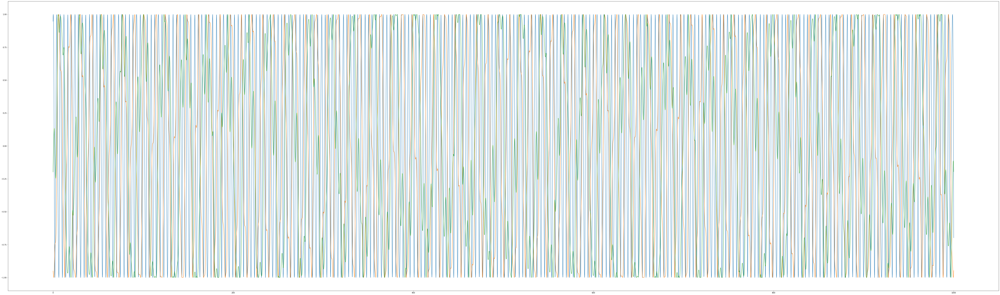

In [534]:
plt.figure(figsize=(100,30))
plt.plot(times,np.sin(thetas[0,:]))
plt.plot(times,np.sin(thetas[1,:]))
plt.plot(times,np.sin(thetas[2,:]))
plt.show()

In [535]:
# Curves
length=30
indifference_value=0

en_cl,am_cl=en_am_cl_sliding(time_series,length)
hyp_h,en_1_h,en_0_h=en_h_hyp_v_sliding(time_series,length,indifference_value)
viol=viol_v_sliding(time_series,length,indifference_value)
hyp_cofl,en_1_cofl,en_0_cofl=en_h_hyp_v_sliding_cofl(time_series,length) 
interval=range(0,1000)[:-2]
en_i,am_i=am_en_i_mod(time_series,interval)

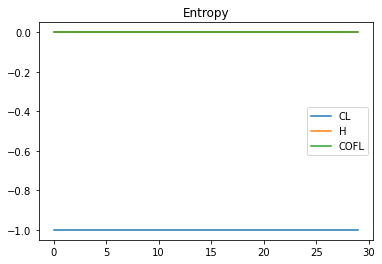

In [536]:
plt.figure()
plt.title("Entropy")
plt.plot(range(length),en_cl)
plt.plot(range(length),en_1_h)
plt.plot(range(length),en_1_cofl)
plt.legend(["CL","H","COFL"])
plt.show()

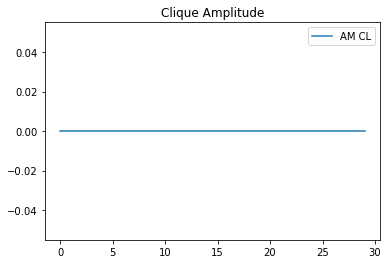

In [537]:
plt.figure()
plt.title("Clique Amplitude")
plt.plot(range(length),am_cl)
plt.legend(["AM CL"])
plt.show()

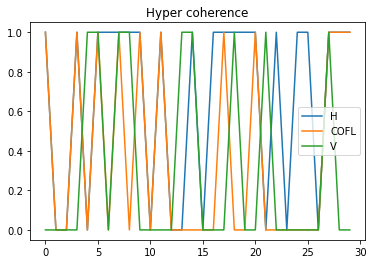

In [538]:
plt.figure()
plt.title("Hyper coherence")
plt.plot(range(length),hyp_h)
plt.plot(range(length),hyp_cofl)
plt.plot(range(length),viol)
plt.legend(["H","COFL","V"])
plt.show()

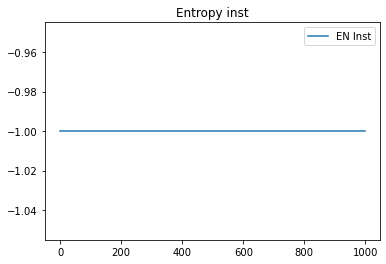

In [539]:
plt.figure()
plt.title("Entropy inst")
plt.plot(interval,en_i)
plt.legend(["EN Inst"])
plt.show()

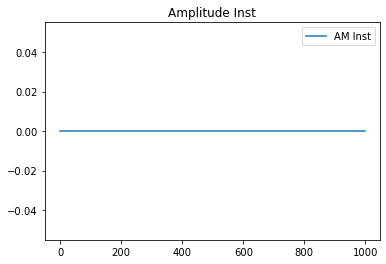

In [540]:
plt.figure()
plt.title("Amplitude Inst")
plt.plot(interval,am_i)
plt.legend(["AM Inst"])
plt.show()

In [541]:
tag_net = tag_sc
structure=S
args = {
    "links": links_sc,
    "triangles": triangles_sc,
    "k1_avg": k1_avg_sc,
    "k2_avg": k2_avg_sc,
}

k1=2
k2=0
ic = "random" # initial condition type, see docs for other possible ones
noise = 5e-1 # noise strength
p2 = None # only used for rand2clust

psi_init = generate_initial_conditions(N, kind=ic, noise=noise, p2=p2, seed=None)
    
thetas, times = simulate_kuramoto(structure,k1,k2,omega=omega,theta_0=psi_init,t_end=t_end,dt=dt,rhs=rhs_lucas,**args)
tag_params = f"k1_{k1:.2f}_k2_{k2:.2f}_ic_{ic}"
tag = f"{tag_net}_{tag_params}"
np.savez(f"{tag}",thetas=thetas,times=times,N=N,ps=ps,kind="sc",k1=k1,k2=k2,omega=omega,ic=ic,noise=noise,t_end=t_end,dt=dt,model="lucas")
time_series=(np.sin(thetas)).T

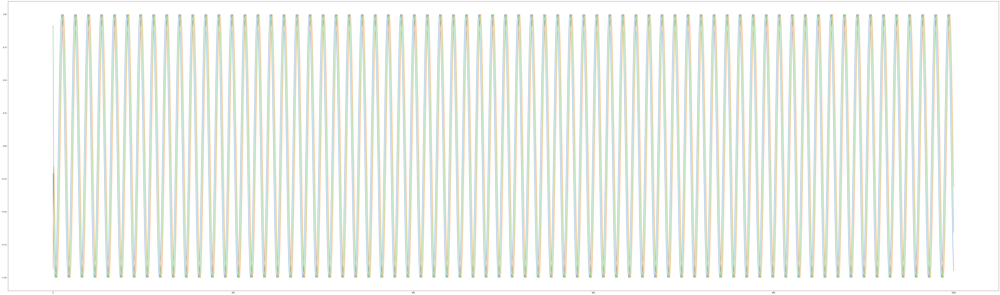

In [542]:
plt.figure(figsize=(100,30))
plt.plot(times,np.sin(thetas[0,:]))
plt.plot(times,np.sin(thetas[1,:]))
plt.plot(times,np.sin(thetas[2,:]))
plt.show()

In [543]:
# Curves
length=30
indifference_value=0

en_cl,am_cl=en_am_cl_sliding(time_series,length)
hyp_h,en_1_h,en_0_h=en_h_hyp_v_sliding(time_series,length,indifference_value)
viol=viol_v_sliding(time_series,length,indifference_value)
hyp_cofl,en_1_cofl,en_0_cofl=en_h_hyp_v_sliding_cofl(time_series,length) 
interval=range(0,1000)[:-2]
en_i,am_i=am_en_i_mod(time_series,interval)

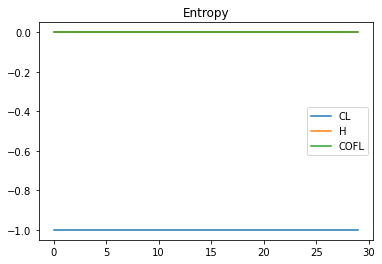

In [544]:
plt.figure()
plt.title("Entropy")
plt.plot(range(length),en_cl)
plt.plot(range(length),en_1_h)
plt.plot(range(length),en_1_cofl)
plt.legend(["CL","H","COFL"])
plt.show()

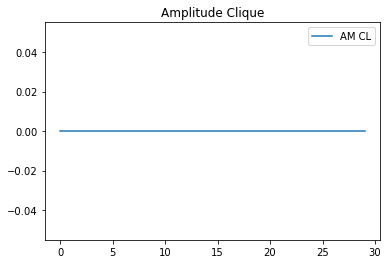

In [545]:
plt.figure()
plt.title("Amplitude Clique")
plt.plot(range(length),am_cl)
plt.legend(["AM CL"])
plt.show()

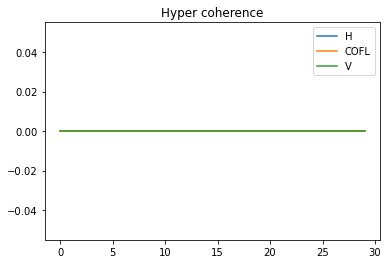

In [546]:
plt.figure()
plt.title("Hyper coherence")
plt.plot(range(length),hyp_h)
plt.plot(range(length),hyp_cofl)
plt.plot(range(length),viol)
plt.legend(["H","COFL","V"])
plt.show()

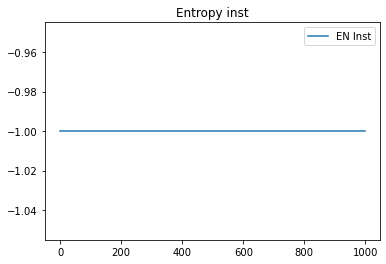

In [547]:
plt.figure()
plt.title("Entropy inst")
plt.plot(interval,en_i)
plt.legend(["EN Inst"])
plt.show()

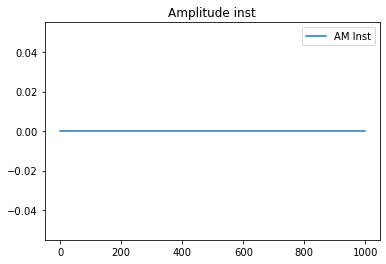

In [548]:
plt.figure()
plt.title("Amplitude inst")
plt.plot(interval,am_i)
plt.legend(["AM Inst"])
plt.show()

In [549]:
tag_net = tag_sc
structure=S
args = {
    "links": links_sc,
    "triangles": triangles_sc,
    "k1_avg": k1_avg_sc,
    "k2_avg": k2_avg_sc,
}

k1=1.4
k2=0
ic = "random" # initial condition type, see docs for other possible ones
noise = 5e-1 # noise strength
p2 = None # only used for rand2clust

psi_init = generate_initial_conditions(N, kind=ic, noise=noise, p2=p2, seed=None)
    
thetas, times = simulate_kuramoto(structure,k1,k2,omega=omega,theta_0=psi_init,t_end=t_end,dt=dt,rhs=rhs_lucas,**args)
tag_params = f"k1_{k1:.2f}_k2_{k2:.2f}_ic_{ic}"
tag = f"{tag_net}_{tag_params}"
np.savez(f"{tag}",thetas=thetas,times=times,N=N,ps=ps,kind="sc",k1=k1,k2=k2,omega=omega,ic=ic,noise=noise,t_end=t_end,dt=dt,model="lucas")
time_series=(np.sin(thetas)).T

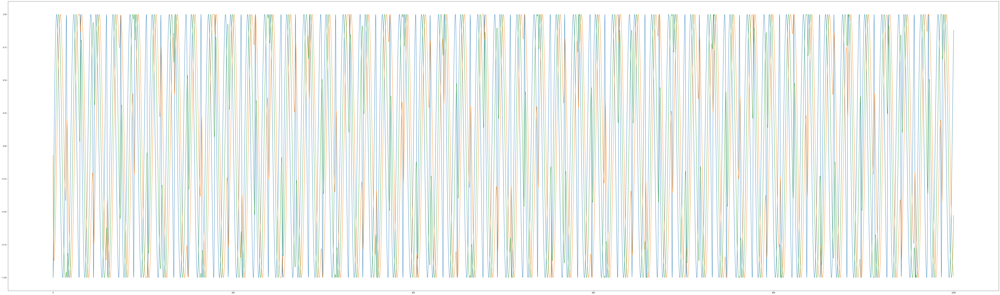

In [550]:
plt.figure(figsize=(100,30))
plt.plot(times,np.sin(thetas[0,:]))
plt.plot(times,np.sin(thetas[1,:]))
plt.plot(times,np.sin(thetas[2,:]))
plt.show()

In [551]:
# Curves
length=30
indifference_value=0

en_cl,am_cl=en_am_cl_sliding(time_series,length)
hyp_h,en_1_h,en_0_h=en_h_hyp_v_sliding(time_series,length,indifference_value)
viol=viol_v_sliding(time_series,length,indifference_value)
hyp_cofl,en_1_cofl,en_0_cofl=en_h_hyp_v_sliding_cofl(time_series,length) 
interval=range(0,1000)[:-2]
en_i,am_i=am_en_i_mod(time_series,interval)

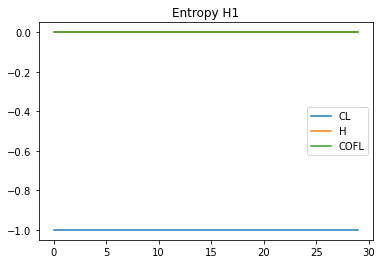

In [552]:
plt.figure()
plt.title("Entropy H1")
plt.plot(range(length),en_cl)
plt.plot(range(length),en_1_h)
plt.plot(range(length),en_1_cofl)
plt.legend(["CL","H","COFL"])
plt.show()

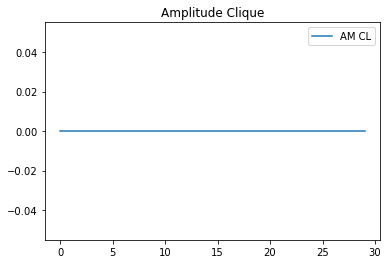

In [553]:
plt.figure()
plt.title("Amplitude Clique")
plt.plot(range(length),am_cl)
plt.legend(["AM CL"])
plt.show()

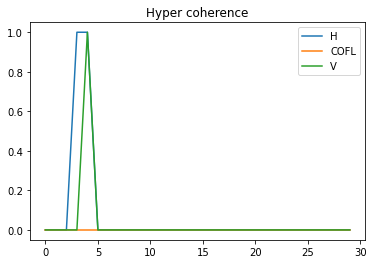

In [554]:
plt.figure()
plt.title("Hyper coherence")
plt.plot(range(length),hyp_h)
plt.plot(range(length),hyp_cofl)
plt.plot(range(length),viol)
plt.legend(["H","COFL","V"])
plt.show()

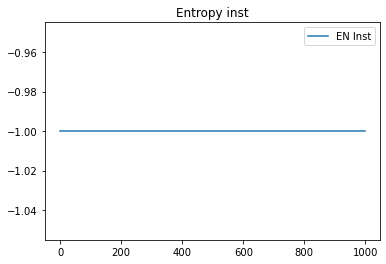

In [555]:
plt.figure()
plt.title("Entropy inst")
plt.plot(interval,en_i)
plt.legend(["EN Inst"])
plt.show()

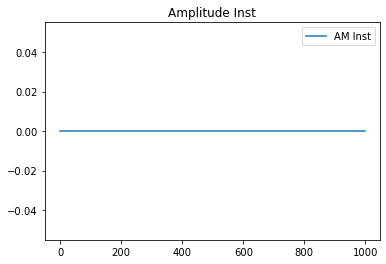

In [556]:
plt.figure()
plt.title("Amplitude Inst")
plt.plot(interval,am_i)
plt.legend(["AM Inst"])
plt.show()